In [1]:
import pandas as pd
import os
import shutil
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import umap
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.image as mpimg
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from PIL import Image
import torch
import clip
from IPython.display import display, HTML
import numpy as np

/Users/thomassmits/miniforge3/envs/clipumap/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/thomassmits/miniforge3/envs/clipumap/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/thomassmits/miniforge3/envs/clipumap/lib/pyth

In [2]:
# Read the TSV file 'excluded_france_photos.tsv' into a pandas DataFrame
df = pd.read_csv('kahnsubset1.tsv', sep='\t')

In [2]:
def load_images(image_folder, save_emb=None, save_path=None):
    """
    Load images from a directory and extract embeddings using a pre-trained model.

    Parameters:
    - image_folder (str): Path to the directory containing the images.
    - save_emb (str, optional): Path to save the embeddings to a numpy file.
    - save_path (str, optional): Path to save the image paths to a numpy file.

    Returns:
    - image_embeddings (numpy array): Array of embeddings for the images.
    - image_paths (list): List of paths for the loaded images.
    """

    # Lists to store embeddings and corresponding image paths
    image_embeddings = []
    image_paths = []

    # Iterate over all files in the specified directory
    for filename in os.listdir(image_folder):
        image_path = os.path.join(image_folder, filename)
        
        # Check if the file is an image (specifically, a JPEG image)
        if os.path.isfile(image_path) and image_path.lower().endswith(".jpg"):
            # Open the image and convert it to RGB format
            image = Image.open(image_path).convert("RGB")
            # Preprocess the image and move it to the device (e.g., GPU)
            image = preprocess(image).unsqueeze(0).to(device)
            
            # Use the model to extract embeddings for the image
            with torch.no_grad():
                image_embedding = model.encode_image(image)
            
            # Append the embeddings and image paths to the respective lists
            image_embeddings.append(image_embedding.cpu().numpy())
            image_paths.append(image_path)

    # Convert the list of embeddings to a numpy array
    image_embeddings = np.concatenate(image_embeddings)

    # Optionally save the embeddings and image paths to numpy files
    if save_emb is not None:
        np.save(save_emb, image_embeddings)
    if save_path is not None:
        np.save(save_path, image_paths)

    return image_embeddings, image_paths

In [21]:
def display4(query, image_embeddings, image_paths, top_k=5, display_size=(400, 400)):
    """
    Display top-k images that are semantically similar to the provided text query.

    Parameters:
    - query (str): Text query to search for.
    - image_embeddings (numpy array): Embeddings of the images.
    - image_paths (list): List of paths corresponding to the image embeddings.
    - top_k (int, optional): Number of top images to display. Default is 5.
    - display_size (tuple, optional): Size of each displayed image. Default is (400, 400).
    """
    
    # Preprocess the text query
    text = clip.tokenize([query]).to(device)
    filelist = []

    # Calculate the text query embedding using the pre-trained model
    with torch.no_grad():
        text_embedding = model.encode_text(text)

    # Normalize the image embeddings and the text embedding for cosine similarity calculation
    image_embeddings = torch.tensor(image_embeddings, device=device)
    image_embeddings /= image_embeddings.norm(dim=-1, keepdim=True)
    text_embedding /= text_embedding.norm(dim=-1, keepdim=True)

    # Compute the cosine similarity between the text query and all image embeddings
    similarity_scores = (image_embeddings @ text_embedding.T).squeeze(1)

    # Sort the images based on their similarity scores
    sorted_indices = np.argsort(similarity_scores.cpu().numpy())[::-1]

    # Create a matplotlib figure for the grid
    n_rows = top_k // 5 + (top_k % 5 > 0)
    plt.figure(figsize=(display_size[0]//100 * 5, display_size[1]//100 * n_rows))
    
    # Display the top-ranked images in a grid layout
    for i in range(top_k):
        index = sorted_indices[i]
        image_path = image_paths[index]
        filelist.append(image_path)

        plt.subplot(n_rows, 5, i + 1)
        image = Image.open(image_path)
        image.thumbnail(display_size)
        plt.imshow(image)
        plt.title(f"Rank {i+1}\nScore: {similarity_scores[index]:.4f}", fontsize=10)
        plt.axis("off")

    # Adjust the spacing between images and save the figure
    plt.tight_layout()
    plt.savefig(f"{query}.png", dpi=300)
    
    # Display the images
    plt.show()
    
    # Print the file paths of the top-ranked images
    print(filelist)

In [5]:
# Determine if CUDA (GPU support) is available, otherwise fall back to CPU
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load the CLIP model ("ViT-B/32" variant) and the corresponding preprocessing function
# The model will be loaded onto the specified device (either GPU or CPU)
model, preprocess = clip.load("ViT-B/32", device=device)

In [11]:
#Loads the vectors of the images for subset 2

#image_folder = "kahnexfrancenotsim"
#save_emb = "kahnexfrnotsimmodel.npy"
#save_path = "kahnexfrnotsimpaths.npy"

In [29]:
#Loads the vectors of the images for person subset 

#image_folder = "kahnpersons"
#save_emb = "kahnpersonsmodel.npy"
#save_path = "kahnpersonspaths.npy"

In [36]:
#Loads the vectors of the images for mountains subset 

#image_folder = "kahnmountains"
#save_emb = "kahnmountainmodel.npy"
#save_path = "kahnmountainpaths.npy"

In [37]:
# Check if a saved version of the image embeddings and paths already exists
if os.path.exists(save_path):
    
    # If it does exist, load the saved image embeddings and paths from the specified file
    image_embeddings = np.load(save_emb)
    image_paths = np.load(save_path)
    
else:
    
    # If it doesn't exist, load the images from the specified folder 
    # and calculate their embeddings using the `load_images` function
    # The embeddings and paths will also be saved for future use
    image_embeddings, image_paths = load_images(image_folder, save_emb=save_emb, save_path=save_path)

Image 15703b4648f5da6d8b70624e8ffd2e49.jpg is similar to Image 942d4ef166fa3dda40e2a97cbaa8ef4e.jpg based on Cosine similarity with a score of 0.9930


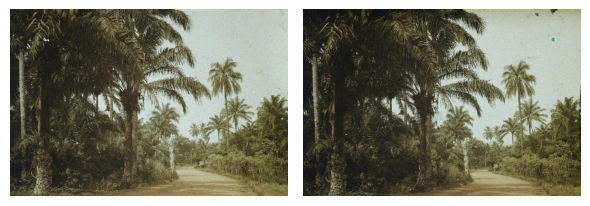

Image 942d4ef166fa3dda40e2a97cbaa8ef4e.jpg is similar to Image 15703b4648f5da6d8b70624e8ffd2e49.jpg based on Cosine similarity with a score of 0.9930


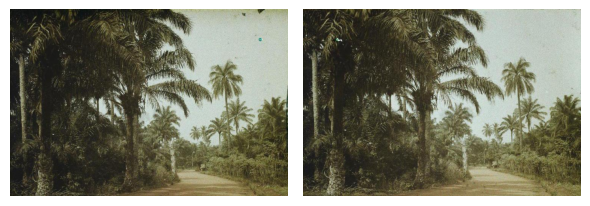

Image 9dc2b7207ce101e5c2a4f1e45d16c1ef.jpg is similar to Image a53aaa2596b421c5914d5c5f0d4a0078.jpg based on Cosine similarity with a score of 0.9926


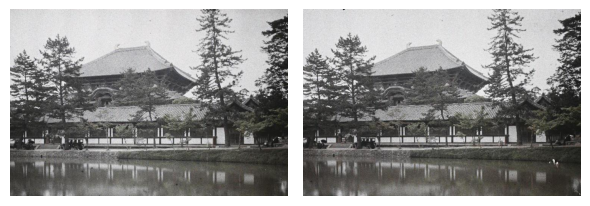

Image a53aaa2596b421c5914d5c5f0d4a0078.jpg is similar to Image 9dc2b7207ce101e5c2a4f1e45d16c1ef.jpg based on Cosine similarity with a score of 0.9926


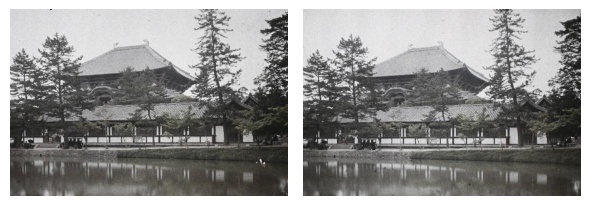

Image dc54a66585119cf3df66c0e5cad9b680.jpg is similar to Image 0e9238d2198ad922a2f0becb622b3374.jpg based on Cosine similarity with a score of 0.9920


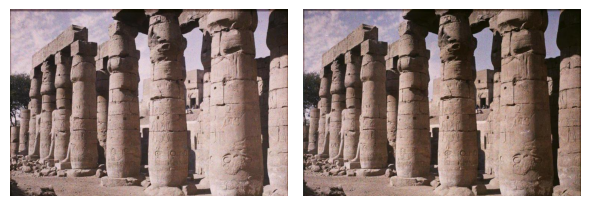

Image 0e9238d2198ad922a2f0becb622b3374.jpg is similar to Image dc54a66585119cf3df66c0e5cad9b680.jpg based on Cosine similarity with a score of 0.9920


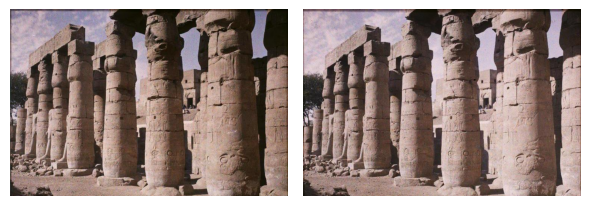

Image 6863a68d0a60071ee5a3401425c428c0.jpg is similar to Image dfab41c41b0f5a0226c228ef390e678b.jpg based on Cosine similarity with a score of 0.9919


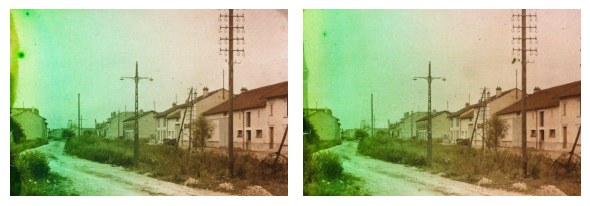

Image dfab41c41b0f5a0226c228ef390e678b.jpg is similar to Image 6863a68d0a60071ee5a3401425c428c0.jpg based on Cosine similarity with a score of 0.9919


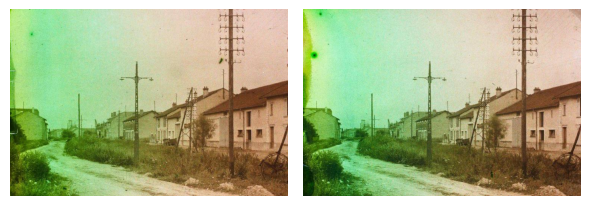

Image dfeac0a62dd3483d131f48c354fe3151.jpg is similar to Image 82f2446a41dafe79851f5216bbc6eb6d.jpg based on Cosine similarity with a score of 0.9916


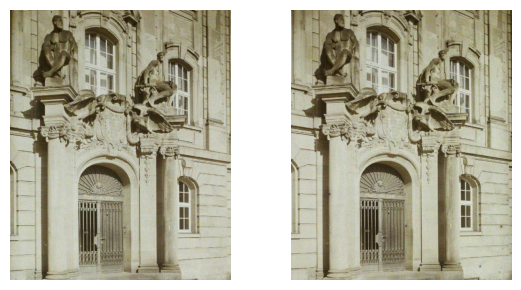

Image 82f2446a41dafe79851f5216bbc6eb6d.jpg is similar to Image dfeac0a62dd3483d131f48c354fe3151.jpg based on Cosine similarity with a score of 0.9916


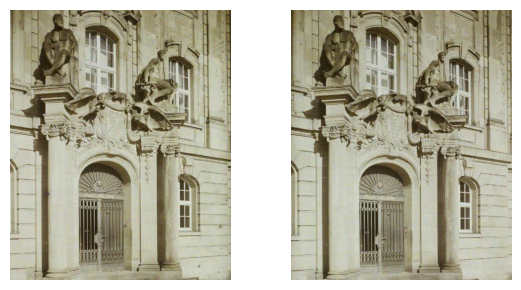

In [6]:
# Find the pairs of images that are similar based on the cosine similarity of their embeddings
# The function 'find_similar_images_cosine' returns the pairs of similar images and their respective similarity scores
# Only pairs with a similarity score above the provided threshold (0.99 in this case) are returned
similar_pairs_cosine, scores = find_similar_images_cosine(image_embeddings, threshold=0.99)

# Loop through the top 10 similar image pairs to display them
for index, pair in enumerate(similar_pairs_cosine[:10]):
    
    # Extract the base filename (i.e., the last part of the path) for both images in the pair
    filename1 = os.path.basename(image_paths[pair[0]])
    filename2 = os.path.basename(image_paths[pair[1]])
    
    # Print the information about the image pair and their similarity score
    print(f"Image {filename1} is similar to Image {filename2} based on Cosine similarity with a score of {scores[index]:.4f}")
    
    # Display the thumbnails of the two similar images side by side
    # Assuming 'show_thumbnails' is a function that accepts two image paths and displays them
    show_thumbnails(image_paths[pair[0]], image_paths[pair[1]])

In [8]:
similar_pairs_cosine, scores = find_similar_images_cosine(image_embeddings, threshold=0.96)

# Create a set of similar images to be removed
images_to_remove = set()
for pair in similar_pairs_cosine:
    # Add only the second image of the pair to the set of images to be removed
    images_to_remove.add(image_paths[pair[1]])

# Create a list of images that are not similar
remaining_images = [path for path in image_paths if path not in images_to_remove]

# Print the results
print(f"Number of original images: {len(image_paths)}")
print(f"Number of images to remove: {len(images_to_remove)}")
print(f"Number of remaining images: {len(remaining_images)}")


Number of original images: 64506
Number of images to remove: 14632
Number of remaining images: 49874


In [74]:
# Cluster the vectors using the K-means. Num_clusters adjusts the number K of clusters

# Step 3: Normalize the embeddings
normalized_embeddings = StandardScaler().fit_transform(image_embeddings)

# Step 4: Apply K-means clustering
num_clusters = 8 # Choose the number of clusters
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(normalized_embeddings)

# Step 5: Retrieve the cluster centroids
centroids = kmeans.cluster_centers_

# Step 6: Assign images to clusters
cluster_labels = kmeans.labels_

# Step 7: Visualize or analyze the clusters
for cluster_id in range(num_clusters):
    cluster_indices = np.where(cluster_labels == cluster_id)[0]
    print(f"peoplecluster {cluster_id}: {len(cluster_indices)} images")
    # Perform further analysis or visualization for each cluster as needed


/Users/thomassmits/miniforge3/envs/clipumap/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: 1182 images
Cluster 1: 2260 images
Cluster 2: 2676 images
Cluster 3: 2761 images
Cluster 4: 1753 images
Cluster 5: 3140 images
Cluster 6: 2156 images
Cluster 7: 2925 images


/Users/thomassmits/miniforge3/envs/clipumap/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/thomassmits/miniforge3/envs/clipumap/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/thomassmits/miniforge3/envs/clipumap/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/thomassmits/miniforge3/envs/clipumap/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value 

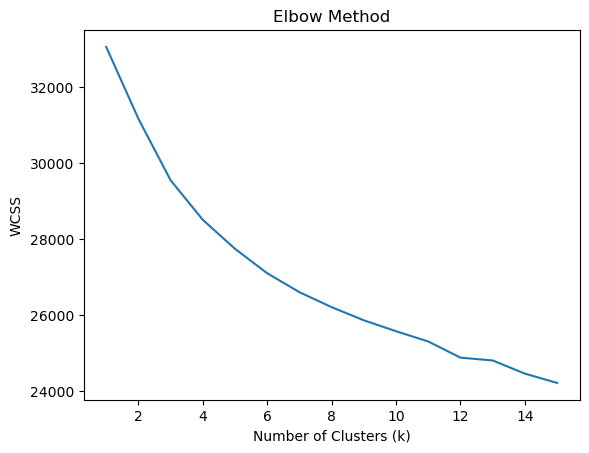

In [22]:
#Elbow Method
#Plot the within-cluster sum of squares (WCSS) against the number of clusters 
#and look for the "elbow" point, where the rate of improvement diminishes significantly. 
#The elbow point represents a trade-off between minimizing the WCSS and 
#the complexity of having more clusters

# Calculate WCSS for different values of K 

wcss = []
max_clusters = 15
for k in range(1, max_clusters+1):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(image_embeddings)
    wcss.append(kmeans.inertia_)

# Plot the WCSS values against the number of clusters
plt.plot(range(1, max_clusters+1), wcss)
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS')
plt.title('Elbow Method')
plt.show()

/Users/thomassmits/miniforge3/envs/clipumap/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


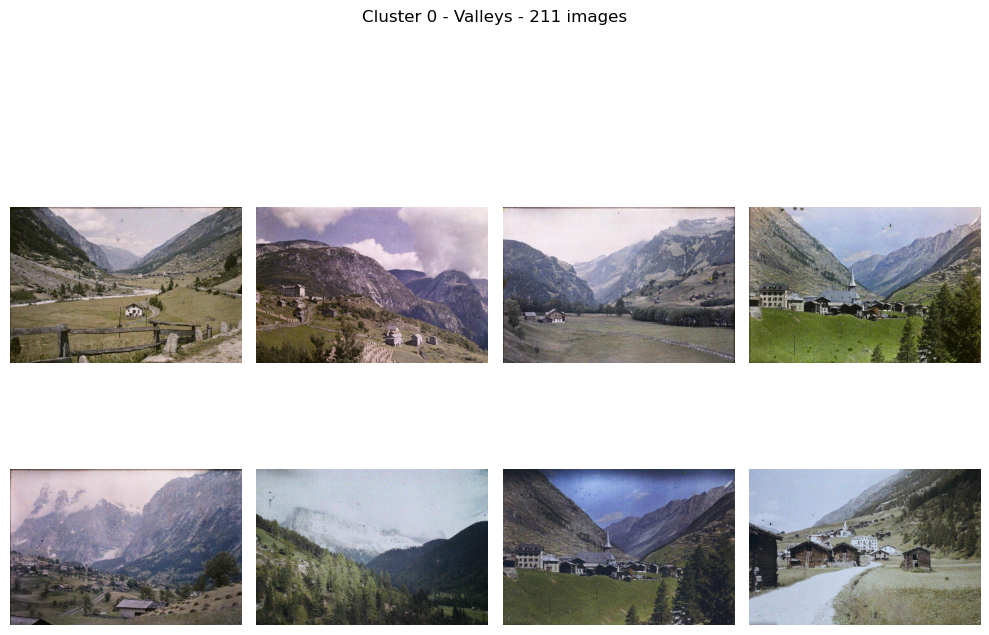

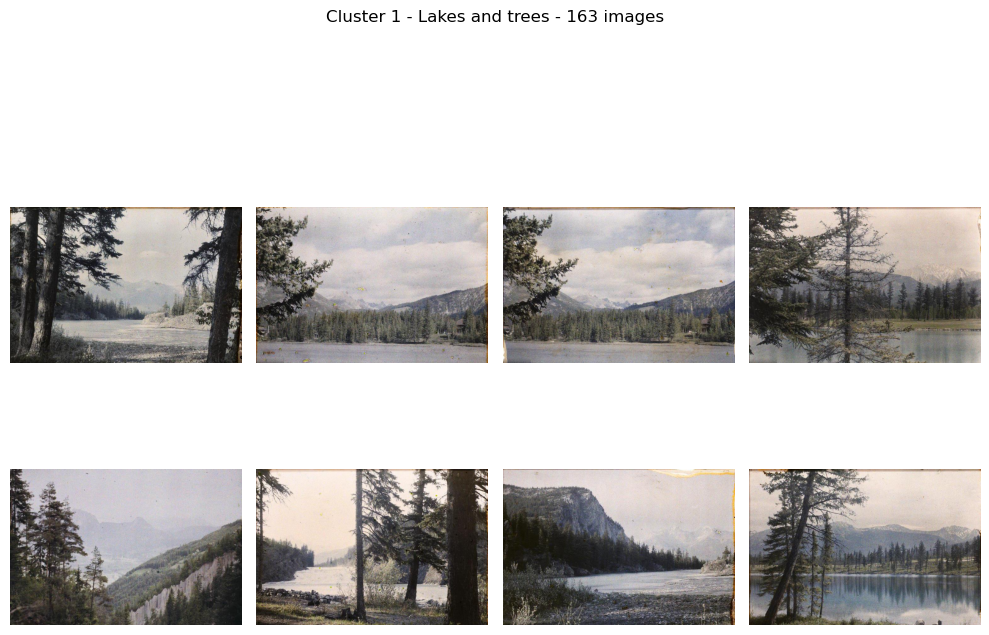

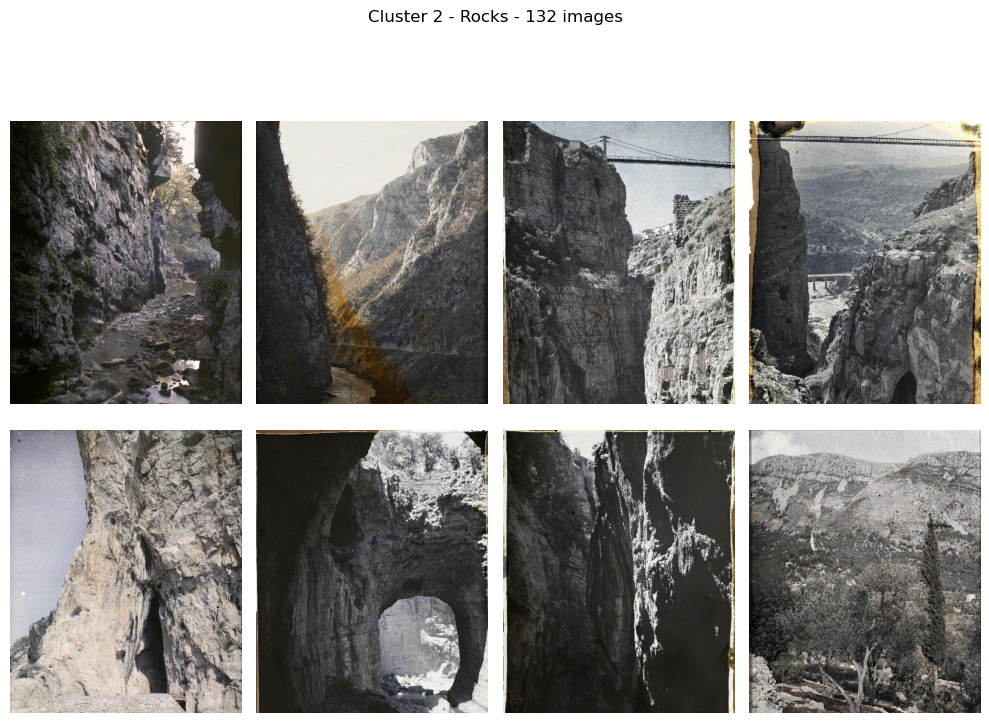

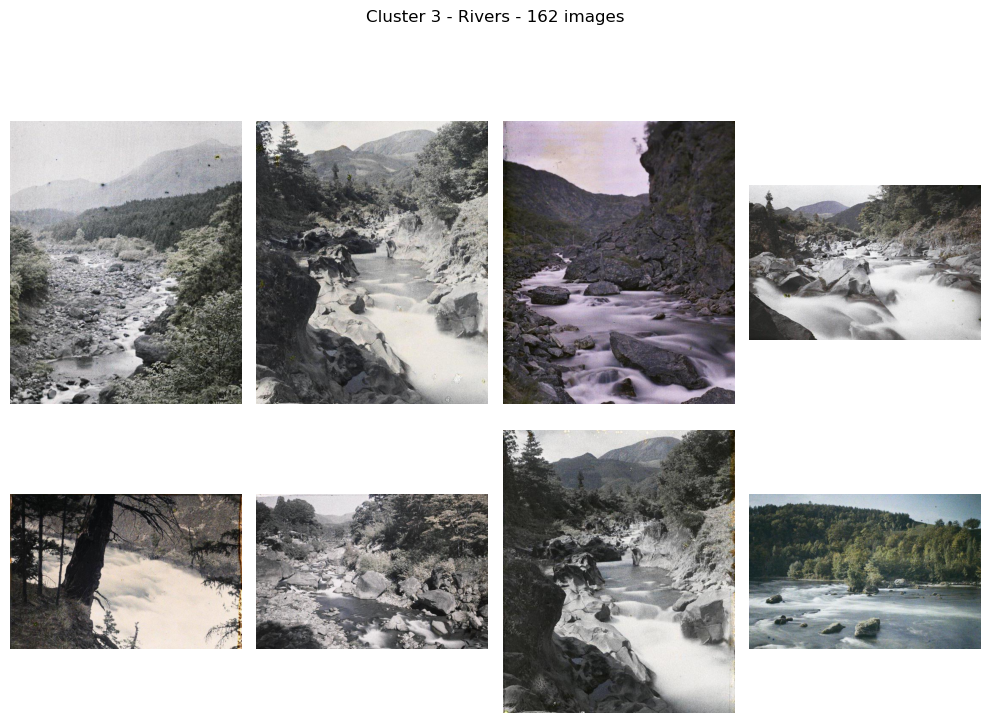

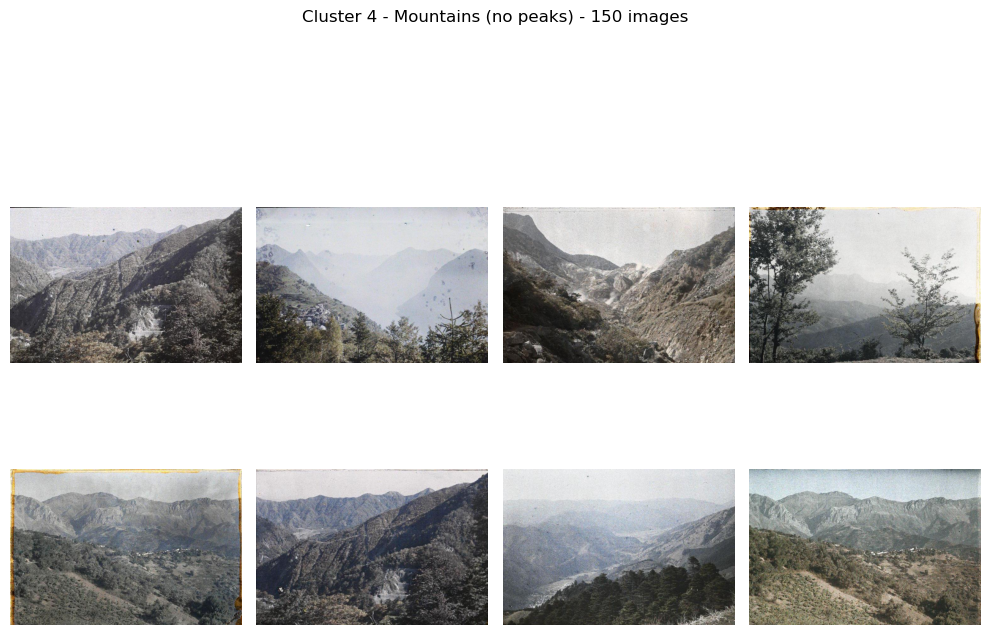

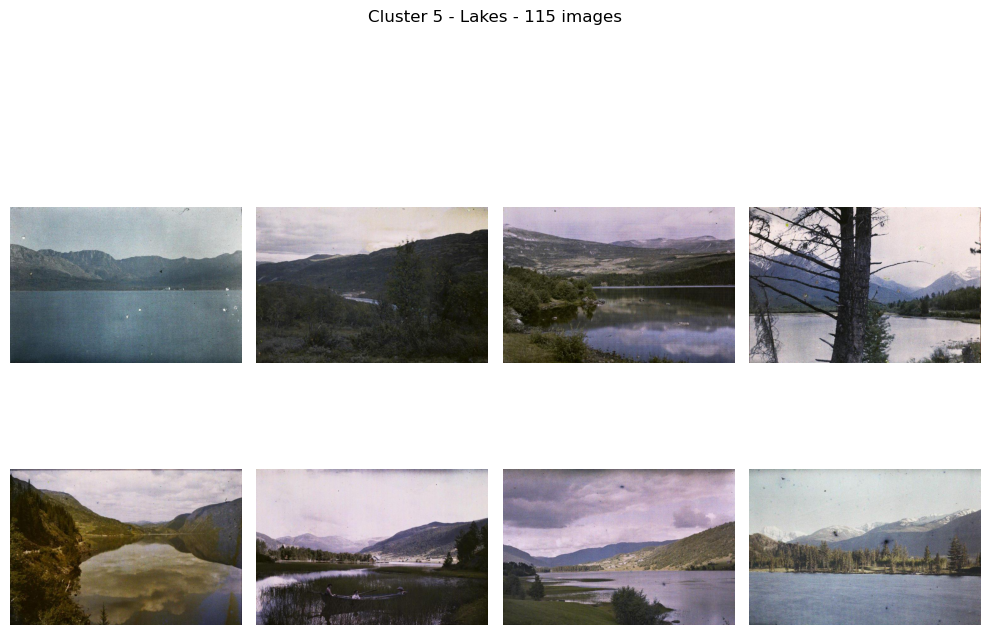

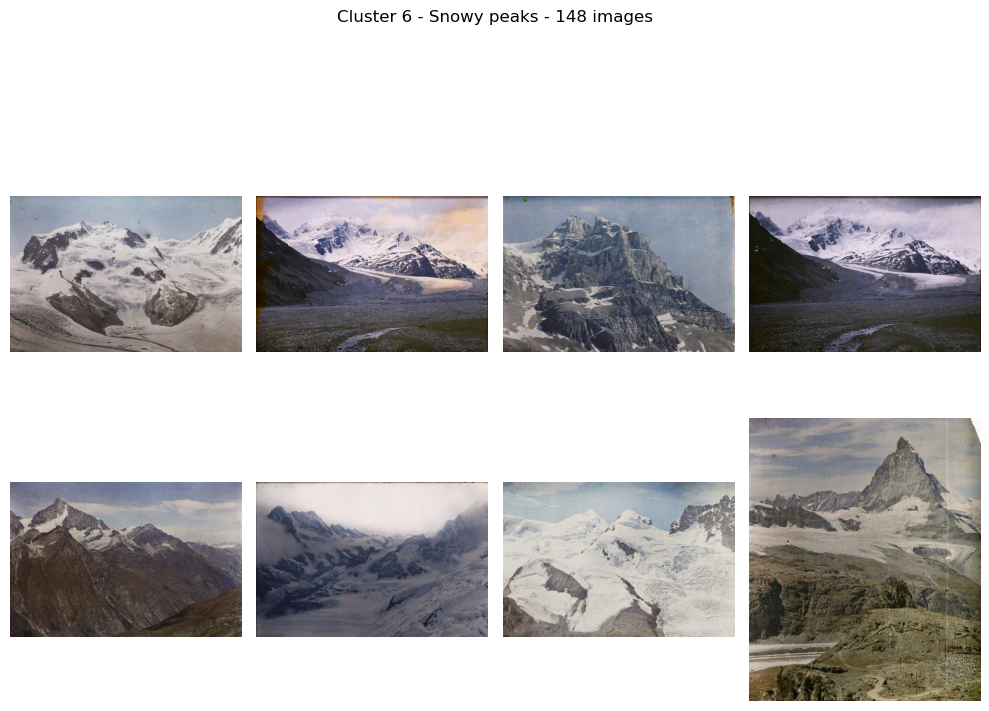

In [43]:
# Preset cluster names to describe the content of each cluster; 
# It's important to note that these names were manually set and might not always represent the content perfectly.

#General #cluster_names = ["European cities", "Mountains", "Ruins", "Persons", "Japanese built environment","Towns","Empty plains", "Dessert built environment", "Architectural details (inside)", "Plains built environment", "Hills and rivers built environment", "Trees (close up)"]
#Mountains #cluster_names = ["Valleys", "Lakes and trees", "Rocks", "Rivers", "Mountains (no peaks)", "Lakes", "Snowy peaks"]
#People #cluster_names = ["Military men", "African men/women", "Women", "Human/animal", "Family", "In front of house", "Non-western men", "Modern men"]

# Step 3: Normalize the embeddings
# This step ensures that all dimensions of the embeddings have the same scale, which can improve clustering performance.
normalized_embeddings = StandardScaler().fit_transform(image_embeddings)

# Step 4: Apply K-means clustering
# K-means clustering attempts to partition the given number of observations into k clusters, where each observation belongs to the cluster with the nearest centroid.
num_clusters = 7  # Define the desired number of clusters
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(normalized_embeddings)

# Step 5: Retrieve the cluster centroids
# The centroid is the mean position of all the points in the cluster.
centroids = kmeans.cluster_centers_

# Step 6: Assign images to clusters based on the nearest centroid
cluster_labels = kmeans.labels_

# Step 7: Display closest images to centroids for each cluster
for cluster_id in range(num_clusters):
    # Retrieve indices of images that belong to the current cluster
    cluster_indices = np.where(cluster_labels == cluster_id)[0]
    cluster_embeddings = normalized_embeddings[cluster_indices]
    
    # Calculate the Euclidean distance from each embedding in the cluster to the cluster's centroid
    centroid = centroids[cluster_id]
    distances = np.linalg.norm(cluster_embeddings - centroid, axis=1)
    
    # Sort embeddings by distance to find the closest ones
    sorted_indices = np.argsort(distances)
    
    # Extract paths of the closest images to the centroid (top 8 in this case)
    closest_indices = cluster_indices[sorted_indices[:8]]
    closest_images = [image_paths[idx] for idx in closest_indices]

    # Display these closest images in a 2x4 grid
    fig, axs = plt.subplots(2, 4, figsize=(10, 8))
    fig.suptitle(f"Cluster {cluster_id} - {cluster_names[cluster_id]} - {len(cluster_indices)} images")

    for j, img_path in enumerate(closest_images):
        img = plt.imread(img_path)
        axs[j // 4, j % 4].imshow(img)
        axs[j // 4, j % 4].axis('off')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    
    # Save the displayed images for each cluster with a resolution of 300 dpi
    fig.savefig(f"generalcluster{cluster_id}.png", dpi=300)
    plt.show()

In [9]:
# Find the indices of all images that belong to cluster with label '1'
cluster_indices = np.where(cluster_labels == 1)[0]

# Use these indices to extract the file paths of the images in the cluster
cluster_image_paths = [image_paths[idx] for idx in cluster_indices]

In [10]:
# Define your source and target directories
source_directory = 'kahnexfrancenotsim'
target_directory = 'kahnmountains'

# Ensure the target directory exists; if not, create it
if not os.path.exists(target_directory):
    os.makedirs(target_directory)

# Copy each file from the source to target directory
for filepath in cluster_image_paths:
    # Extract filename from the filepath
    filename = os.path.basename(filepath)
    
    # Define the source and destination file paths
    source_path = os.path.join(source_directory, filename)
    destination_path = os.path.join(target_directory, filename)
    
    # Copy the file
    shutil.copy(source_path, destination_path)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/var/folders/mc/tb3lf_s11xn8vqdxfr288ly40000gn/T/ipykernel_72289/737250968.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = cm.get_cmap('tab10', num_clusters)


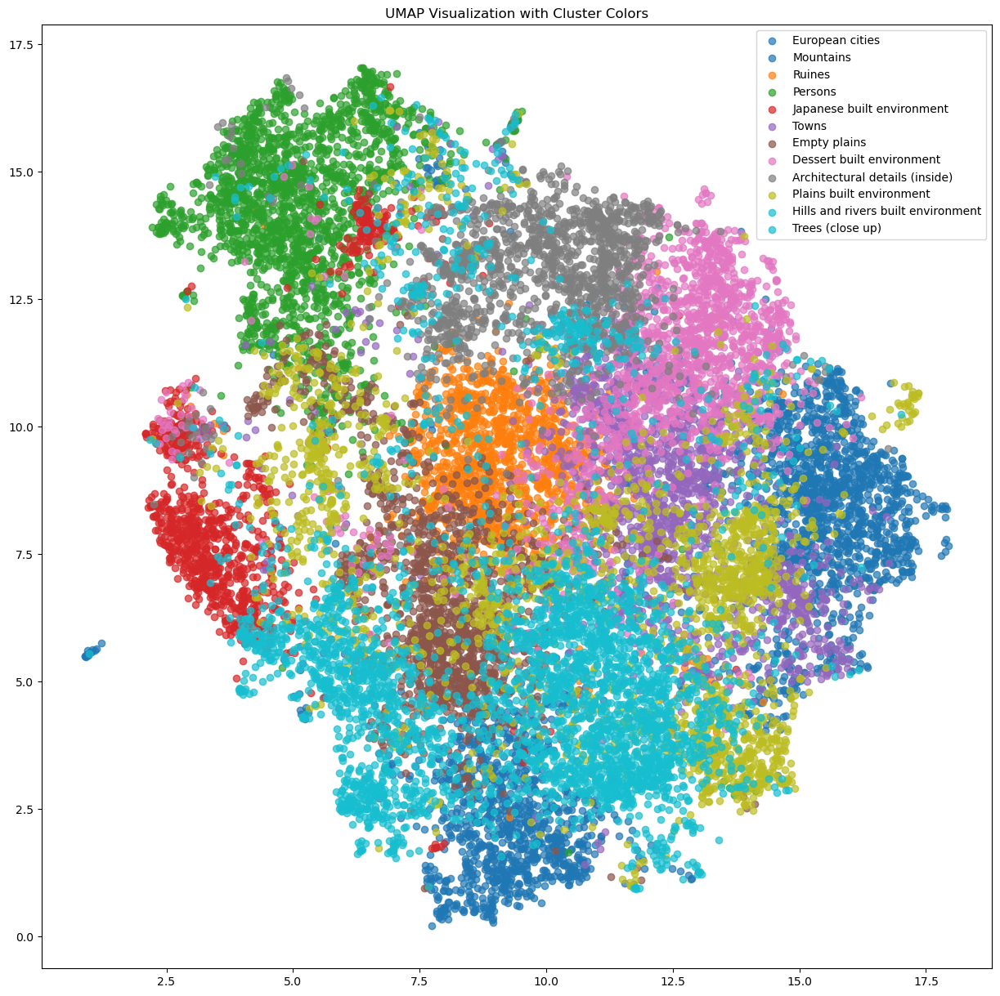

In [90]:
# Step 4: Apply UMAP dimensionality reduction
umap_embeddings = umap.UMAP(n_neighbors=10, min_dist=0.5, metric='cosine').fit_transform(normalized_embeddings)  # Use normalized_embeddings here

# Step 5: Create a color map based on the cluster labels
num_clusters = len(np.unique(cluster_labels))
color_map = cm.get_cmap('tab10', num_clusters)

# Step 6: Visualize the UMAP embeddings with colored points
plt.figure(figsize=(15, 15))
for label in np.unique(cluster_labels):
    indices = np.where(cluster_labels == label)[0]
    plt.scatter(umap_embeddings[indices, 0], umap_embeddings[indices, 1], c=[color_map(label)], label=cluster_names[label], alpha=0.7)
plt.legend()
plt.title("UMAP Visualization with Cluster Colors")
# Save the figure with high DPI to increase thumbnail quality
plt.savefig("umap_visualization.png", dpi=300)
plt.show()

/var/folders/mc/tb3lf_s11xn8vqdxfr288ly40000gn/T/ipykernel_72289/2455266868.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('tab10', num_clusters)


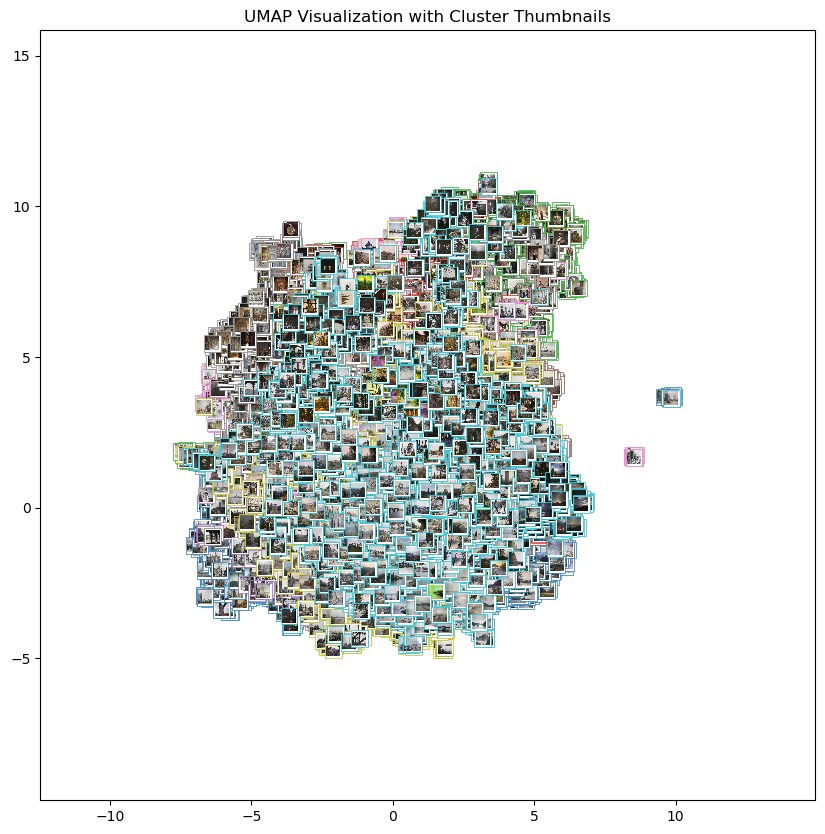

In [91]:
# Step 1: Compute UMAP embeddings
umap_embeddings = umap.UMAP(n_neighbors=10, min_dist=0.5, metric='cosine').fit_transform(image_embeddings)

# Step 2: Create a color map based on the cluster labels
num_clusters = len(np.unique(cluster_labels))
color_map = plt.cm.get_cmap('tab10', num_clusters)

# Define thumbnail size in pixels
thumbnail_size = 200

# Step 3: Visualize the UMAP embeddings with colored points and image thumbnails
fig, ax = plt.subplots(figsize=(10, 10))
for label in np.unique(cluster_labels):
    indices = np.where(cluster_labels == label)[0]
    cluster_embeddings = umap_embeddings[indices]
    cluster_image_paths = [image_paths[i] for i in indices]

    for embedding, image_path in zip(cluster_embeddings, cluster_image_paths):
        img = Image.open(image_path)
        img = img.resize((thumbnail_size, thumbnail_size))  # Use Image.ANTIALIAS for anti-aliasing
        img = np.array(img)

        imagebox = OffsetImage(img, zoom=0.05)
        imagebox.image.axes = ax
        ab = AnnotationBbox(imagebox, embedding, frameon=True, pad=0.1,
                            bboxprops=dict(edgecolor=color_map(label), lw=0.5))
        ax.add_artist(ab)

ax.set_xlim(np.min(umap_embeddings[:, 0]) - 5, np.max(umap_embeddings[:, 0]) + 5)
ax.set_ylim(np.min(umap_embeddings[:, 1]) - 5, np.max(umap_embeddings[:, 1]) + 5)
ax.set_title("UMAP Visualization with Cluster Thumbnails")

# Save the figure with high DPI to increase thumbnail quality
plt.savefig("umap_visualization.png", dpi=300)

# Show the plot
plt.show()

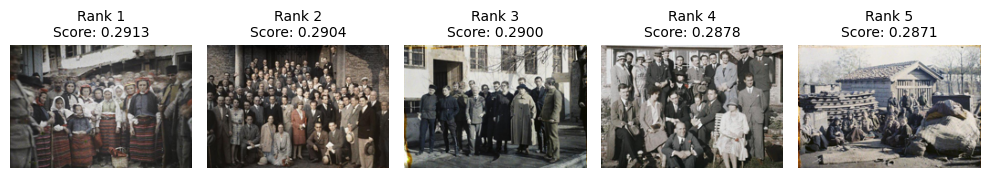

['kahnpersons/0c2b62639858b2b9c06d84dc3d7cd215.jpg', 'kahnpersons/6c66975e088cce0a28731e05735d04f8.jpg', 'kahnpersons/1a6e256419cdc932f0b745d6950a6780.jpg', 'kahnpersons/aeab84a29cc9f6276b006ba79c044c45.jpg', 'kahnpersons/579f55425855d6bdaa54227bfa51f7b7.jpg']


In [33]:
# Define the text query you're interested in
query = "a group of men and women"

# Call the 'display4' function to find and display images most similar to the query
# This function works as follows:
# 1. Converts the query into an embedding using the CLIP model
# 2. Calculates cosine similarity between the query embedding and all image embeddings
# 3. Sorts the images based on their similarity scores
# 4. Displays the top 'k' images most similar to the query
# 5. Saves a visual grid of these top images as a PNG file named after the query
# 6. Prints out the paths to these top images
display4(query, image_embeddings, image_paths, top_k=5, display_size=(200, 200))
